In [2]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
import glob

#!pip install ultralytics
from ultralytics import YOLO


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# prompt: I want to  unzip a file

!unzip /content/drive/MyDrive/Dinesh/dataset_split.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0464_1.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0465_3.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0465_4.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0466_2.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0466_3.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0466_4.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0467_2.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0467_4.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_building_image0468_0.txt  
  inflating: /content/dataset_split_preprocess/train/labels/collapsed_buildi

## EDA of the dataset

### Distribution of the dataset

In [ ]:
train_image_folder = './dataset_split/train/images'
train_label_folder =  './dataset_split/train/labels/'

test_image_folder = './dataset_split/test/images'
test_label_folder =  './dataset_split/test/labels/'

In [ ]:
# Function to count files in a directory
def count_files_in_directory(directory):
    return len([file for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))])

# Count images and labels in train and test folders
train_image_count = count_files_in_directory(train_image_folder)
train_label_count = count_files_in_directory(train_label_folder)

test_image_count = count_files_in_directory(test_image_folder)
test_label_count = count_files_in_directory(test_label_folder)

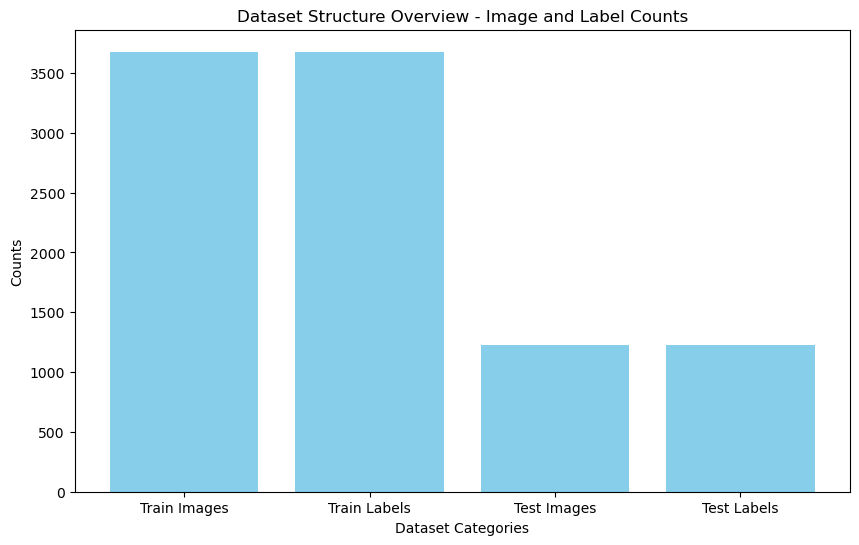

In [ ]:
categories = ['Train Images', 'Train Labels', 'Test Images', 'Test Labels']
counts = [train_image_count, train_label_count, test_image_count, test_label_count]

# Plotting the data distribution
plt.figure(figsize=(10, 6))
plt.bar(categories, counts, color='skyblue')
plt.title("Dataset Structure Overview - Image and Label Counts")
plt.xlabel("Dataset Categories")
plt.ylabel("Counts")
plt.show()

## Distribution of pose

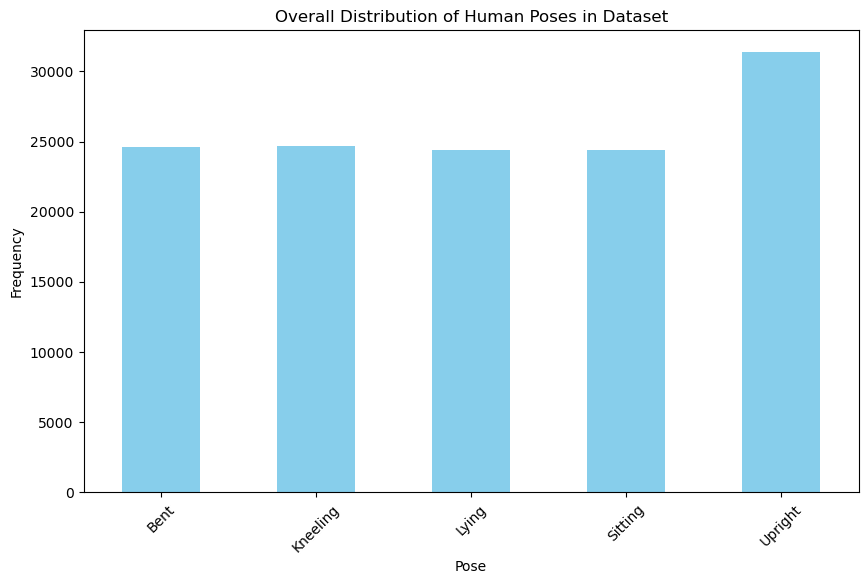

In [ ]:
label_folder_path = './dataset_split/train/labels/'

# Mapping of pose labels
pose_labels = {0: 'Bent', 1: 'Kneeling', 2: 'Lying', 3: 'Sitting', 4: 'Upright'}

# Initialize list to store pose information from all files
all_annotations = []

# Iterating through each .txt file in the specified folder
for file_path in glob.glob(os.path.join(label_folder_path, '*.txt')):
    with open(file_path, 'r') as file:
        for line in file:
            values = line.strip().split()
            pose = int(values[0])  # Extracting the 6th value (pose)
            all_annotations.append(pose_labels[pose])

# Count the occurrences of each pose across all files
pose_counts = pd.Series(all_annotations).value_counts().sort_index()

# Plotting the overall distribution of poses
plt.figure(figsize=(10, 6))
pose_counts.plot(kind='bar', color='skyblue')
plt.title("Overall Distribution of Human Poses in Dataset")
plt.xlabel("Pose")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()

### Visualisation of image with box

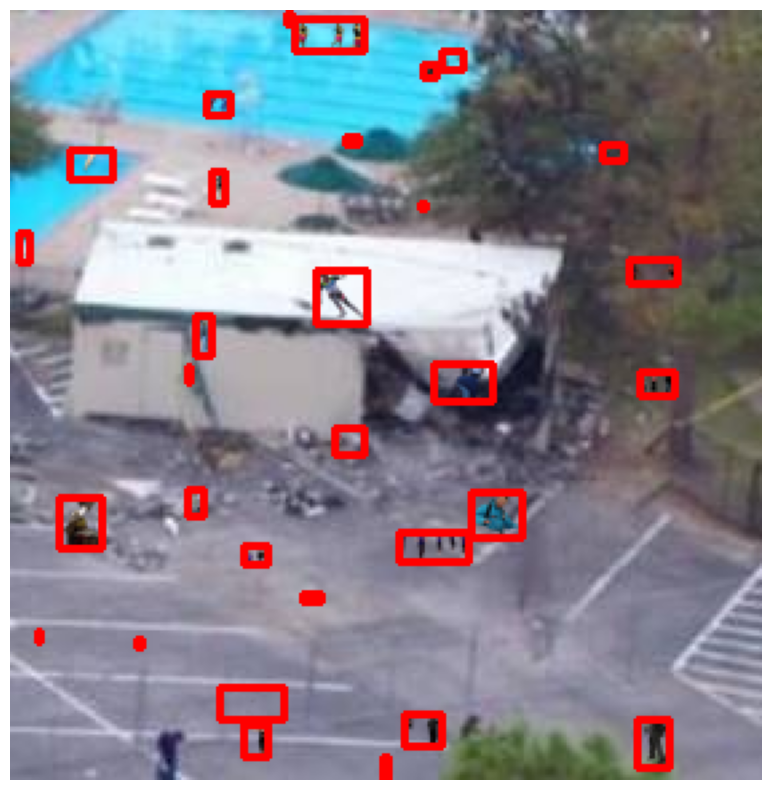

In [ ]:
# Function to visualize YOLO annotations on images
def visualize_annotations(image_path, label_path):
    # Read the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

    # Get image dimensions
    height, width, _ = image.shape

    # Open and read the annotation file
    with open(label_path, 'r') as file:
        for line in file.readlines():
            # Parse YOLO format annotation (class, x_center, y_center, width, height)
            class_id, x_center, y_center, box_width, box_height = map(float, line.strip().split())

            # Convert normalized coordinates to pixel values
            x_center *= width
            y_center *= height
            box_width *= width
            box_height *= height

            # Calculate top-left and bottom-right corners of the bounding box
            x1 = int(x_center - box_width / 2)
            y1 = int(y_center - box_height / 2)
            x2 = int(x_center + box_width / 2)
            y2 = int(y_center + box_height / 2)

            # Draw the bounding box on the image
            image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # Display the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Example usage

sample_image = os.path.join(train_image_folder, 'collapsed_building_image0001_0.png')
sample_label = os.path.join(train_label_folder, 'collapsed_building_image0001_0.txt')

visualize_annotations(sample_image, sample_label)

### Image height and width distribution

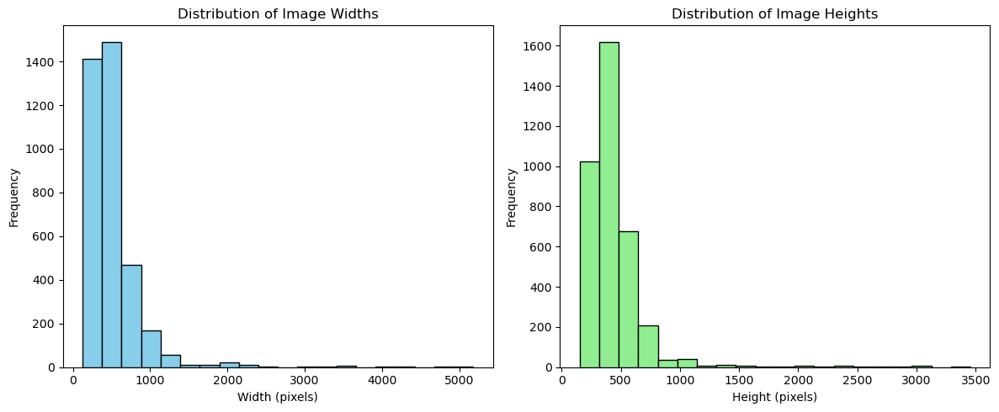

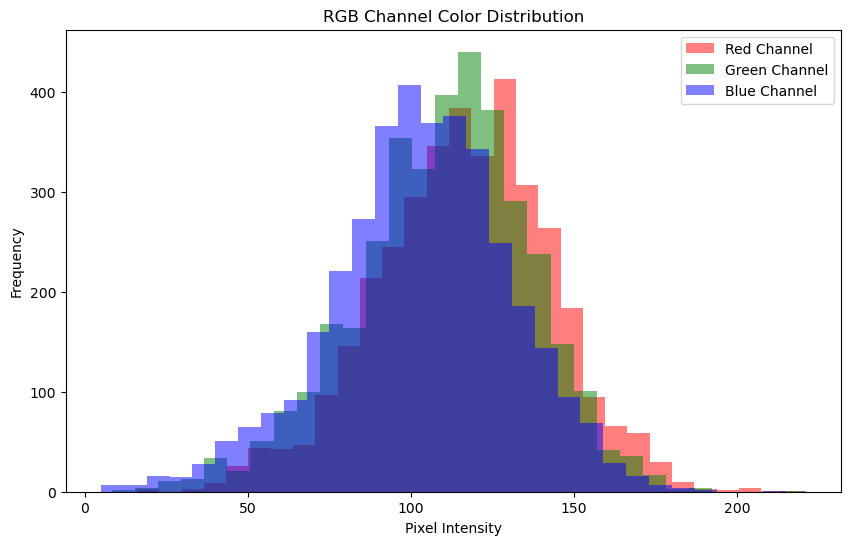

In [ ]:
image_folder_path = './dataset_split/train/images'

# Lists to store image resolutions and RGB channel data
resolutions = []
red_channel = []
green_channel = []
blue_channel = []

# Loop through each image in the folder
for filename in os.listdir(image_folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(image_folder_path, filename)
        with Image.open(image_path) as img:
            # Record the resolution (width, height) of each image
            resolutions.append(img.size)

            # Convert image to numpy array for RGB channel analysis
            img_array = np.array(img)
            if img_array.ndim == 3:  # Check if the image is RGB
                red_channel.append(np.mean(img_array[:, :, 0]))
                green_channel.append(np.mean(img_array[:, :, 1]))
                blue_channel.append(np.mean(img_array[:, :, 2]))

# Plotting Resolution Distribution
widths, heights = zip(*resolutions)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Image Widths")
plt.xlabel("Width (pixels)")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(heights, bins=20, color='lightgreen', edgecolor='black')
plt.title("Distribution of Image Heights")
plt.xlabel("Height (pixels)")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

# Plotting Color Distribution
plt.figure(figsize=(10, 6))
plt.hist(red_channel, bins=30, color='red', alpha=0.5, label='Red Channel')
plt.hist(green_channel, bins=30, color='green', alpha=0.5, label='Green Channel')
plt.hist(blue_channel, bins=30, color='blue', alpha=0.5, label='Blue Channel')
plt.title("RGB Channel Color Distribution")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()


### Image Boundary box and Aspect ratio distribution

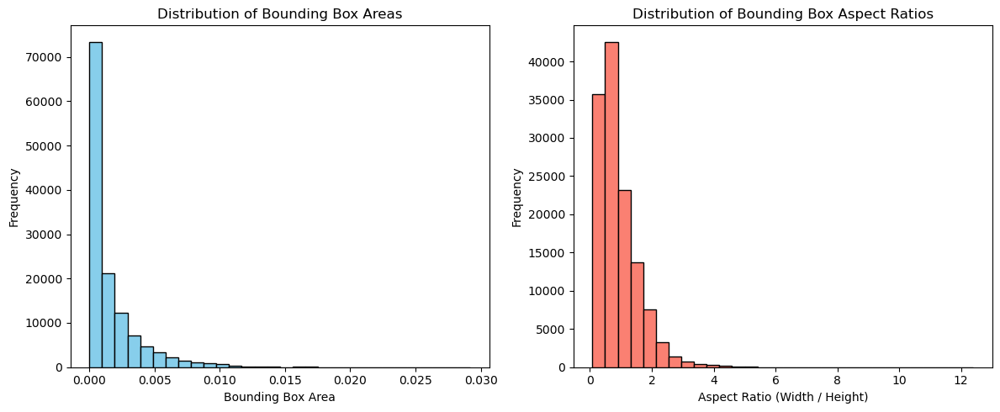

In [ ]:
label_folder_path = './dataset_split/train/labels'

# Lists to store bounding box areas and aspect ratios
bounding_box_areas = []
aspect_ratios = []

# Loop through each annotation file
for filename in os.listdir(label_folder_path):
    if filename.endswith('.txt'):
        file_path = os.path.join(label_folder_path, filename)

        with open(file_path, 'r') as file:
            for line in file:
                values = line.strip().split()
                # width and height are at index 3 and 4 in YOLO format
                width = float(values[3])
                height = float(values[4])

                # Calculate area and aspect ratio for each bounding box
                area = width * height
                aspect_ratio = width / height if height != 0 else 0  # Avoid division by zero

                bounding_box_areas.append(area)
                aspect_ratios.append(aspect_ratio)

# Plotting Bounding Box Area Distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(bounding_box_areas, bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Bounding Box Areas")
plt.xlabel("Bounding Box Area")
plt.ylabel("Frequency")

# Plotting Aspect Ratio Distribution
plt.subplot(1, 2, 2)
plt.hist(aspect_ratios, bins=30, color='salmon', edgecolor='black')
plt.title("Distribution of Bounding Box Aspect Ratios")
plt.xlabel("Aspect Ratio (Width / Height)")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

### Distribution of pixel intensity

Pixel Intensity Summary Statistics Across All Images:
       Mean Intensity  Median Intensity  Standard Deviation
count     3677.000000       3677.000000         3677.000000
mean       111.101420        108.945472           44.144267
std         26.017574         31.262370           12.273346
min         10.269985          1.000000           10.994080
25%         95.030595         89.000000           35.495689
50%        112.895996        110.000000           44.489307
75%        128.656079        130.000000           52.434546
max        220.155642        232.000000           84.429885


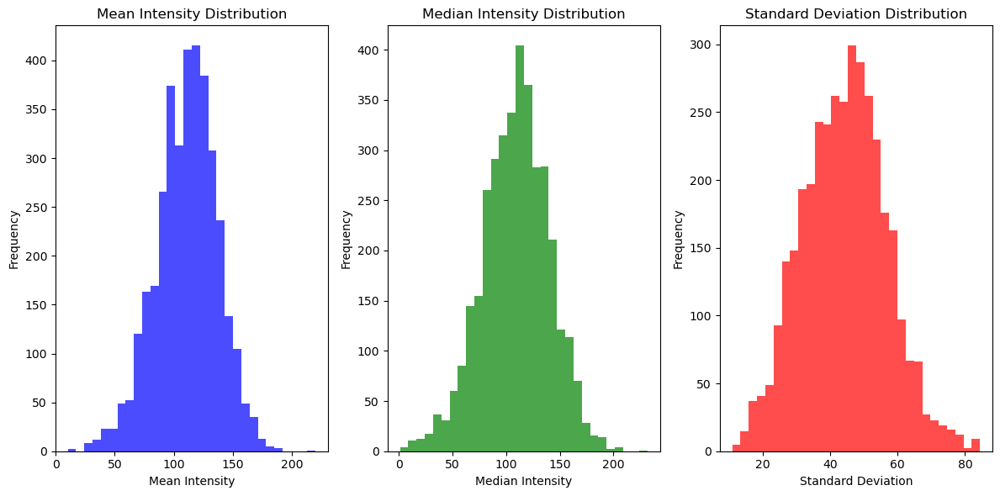

In [ ]:
image_folder_path = './dataset_split/train/images'

# Lists to store pixel statistics
means = []
medians = []
std_devs = []

# Loop through each image in the folder
for filename in os.listdir(image_folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(image_folder_path, filename)

        with Image.open(image_path) as img:
            img = img.convert('L')  # Convert to grayscale to simplify intensity analysis
            img_array = np.array(img)

            # Calculate statistics for the image
            means.append(np.mean(img_array))
            medians.append(np.median(img_array))
            std_devs.append(np.std(img_array))

# Summarize statistics across all images
pixel_stats = pd.DataFrame({
    'Mean Intensity': means,
    'Median Intensity': medians,
    'Standard Deviation': std_devs
})

# Display the summary statistics
summary_stats = pixel_stats.describe()
print("Pixel Intensity Summary Statistics Across All Images:")
print(summary_stats)

# Plotting the distributions of mean, median, and standard deviation
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot Mean Intensity Distribution
plt.subplot(1, 3, 1)
plt.hist(means, bins=30, color='blue', alpha=0.7)
plt.title('Mean Intensity Distribution')
plt.xlabel('Mean Intensity')
plt.ylabel('Frequency')

# Plot Median Intensity Distribution
plt.subplot(1, 3, 2)
plt.hist(medians, bins=30, color='green', alpha=0.7)
plt.title('Median Intensity Distribution')
plt.xlabel('Median Intensity')
plt.ylabel('Frequency')

# Plot Standard Deviation Distribution
plt.subplot(1, 3, 3)
plt.hist(std_devs, bins=30, color='red', alpha=0.7)
plt.title('Standard Deviation Distribution')
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


### Box coverage percentage

Bounding Box Coverage Summary:
{'Mean Coverage (%)': 5.662875857757726, 'Median Coverage (%)': 4.2258491209, 'Max Coverage (%)': 51.754333563299994, 'Min Coverage (%)': 0.017917410399999997}


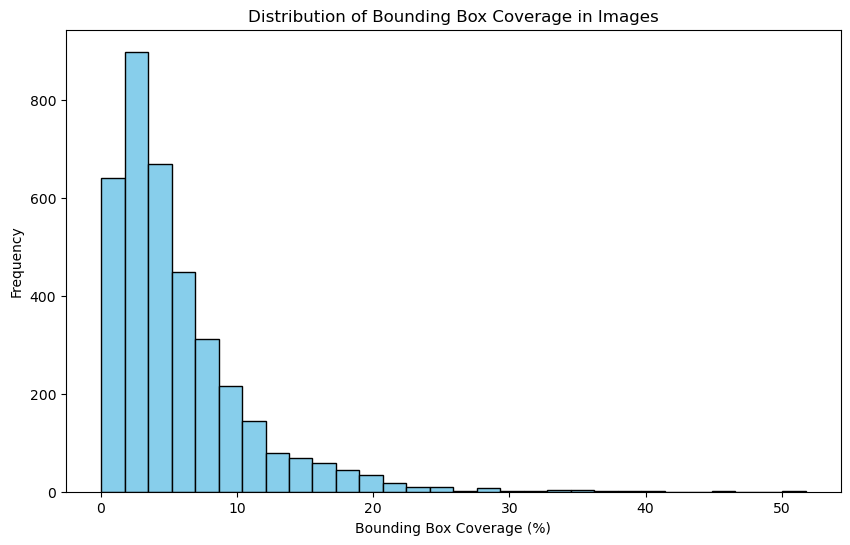

In [ ]:
label_folder_path = './dataset_split/train/labels'
image_folder_path = './dataset_split/train/images'

# List to store the percentage area covered by bounding boxes in each image
coverage_percentages = []

# Loop through each annotation file
for label_file in os.listdir(label_folder_path):
    if label_file.endswith('.txt'):
        # Get corresponding image file name (assuming same base name)
        image_file = label_file.replace('.txt', '.png')  # or '.png' if images are in PNG format
        image_path = os.path.join(image_folder_path, image_file)

        # Load image to get its dimensions
        if os.path.exists(image_path):
            with Image.open(image_path) as img:
                img_width, img_height = img.size
                img_area = img_width * img_height

                # Read bounding boxes from label file
                total_bbox_area = 0
                label_path = os.path.join(label_folder_path, label_file)

                with open(label_path, 'r') as file:
                    for line in file:
                        values = line.strip().split()
                        # Width and height in YOLO format are relative to image dimensions
                        bbox_width = float(values[3]) * img_width
                        bbox_height = float(values[4]) * img_height
                        bbox_area = bbox_width * bbox_height
                        total_bbox_area += bbox_area

                # Calculate coverage percentage
                coverage_percentage = (total_bbox_area / img_area) * 100
                coverage_percentages.append(coverage_percentage)

# Display basic statistics on bounding box coverage
coverage_summary = {
    'Mean Coverage (%)': np.mean(coverage_percentages),
    'Median Coverage (%)': np.median(coverage_percentages),
    'Max Coverage (%)': np.max(coverage_percentages),
    'Min Coverage (%)': np.min(coverage_percentages)
}
print("Bounding Box Coverage Summary:")
print(coverage_summary)

# Plotting the coverage distribution
plt.figure(figsize=(10, 6))
plt.hist(coverage_percentages, bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Bounding Box Coverage in Images")
plt.xlabel("Bounding Box Coverage (%)")
plt.ylabel("Frequency")
plt.show()


### Implementing Bilateral Filtering to reduce noise

#### Step 1: Parameter tuning for Bilateral Filtering

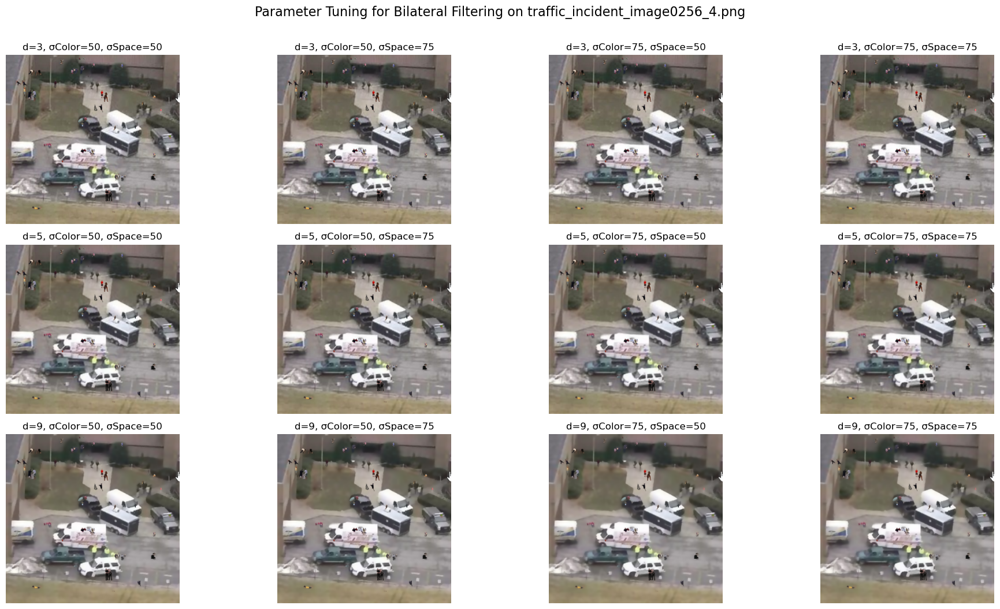

In [3]:
image_dir = "./dataset_split/train/images'

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 1 image for parameter tuning
random_image = random.choice(image_files)
img_path = os.path.join(image_dir, random_image)

# Read the image
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct color display

# Define parameter ranges
d_values = [3, 5, 9]
sigmaColor_values = [50, 75]
sigmaSpace_values = [50, 75]

# Total number of parameter combinations
num_combinations = len(d_values) * len(sigmaColor_values) * len(sigmaSpace_values)

# Calculate grid size
num_rows = len(d_values)
num_cols = len(sigmaColor_values) * len(sigmaSpace_values)

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))

# Loop through parameter combinations and plot images
plot_num = 0
for i, d in enumerate(d_values):
    for j, sigmaColor in enumerate(sigmaColor_values):
        for k, sigmaSpace in enumerate(sigmaSpace_values):
            # Apply Bilateral Filtering with current parameters
            bilateral_filtered_image = cv2.bilateralFilter(image_rgb, d=d, sigmaColor=sigmaColor, sigmaSpace=sigmaSpace)

            # Get the current axis
            ax = axes[i, j * len(sigmaSpace_values) + k]
            ax.imshow(bilateral_filtered_image)
            ax.set_title(f"d={d}, σColor={sigmaColor}, σSpace={sigmaSpace}")
            ax.axis('off')

# Adjust layout and show the grid
plt.tight_layout()
plt.suptitle(f"Parameter Tuning for Bilateral Filtering on {random_image}", y=1.05, fontsize=16)
plt.show()


#### Step 2: Selected Parameters are implemented and output is plotted

#### Selected parameters are: d=5, sigmaColor=50, sigmaSpace=75

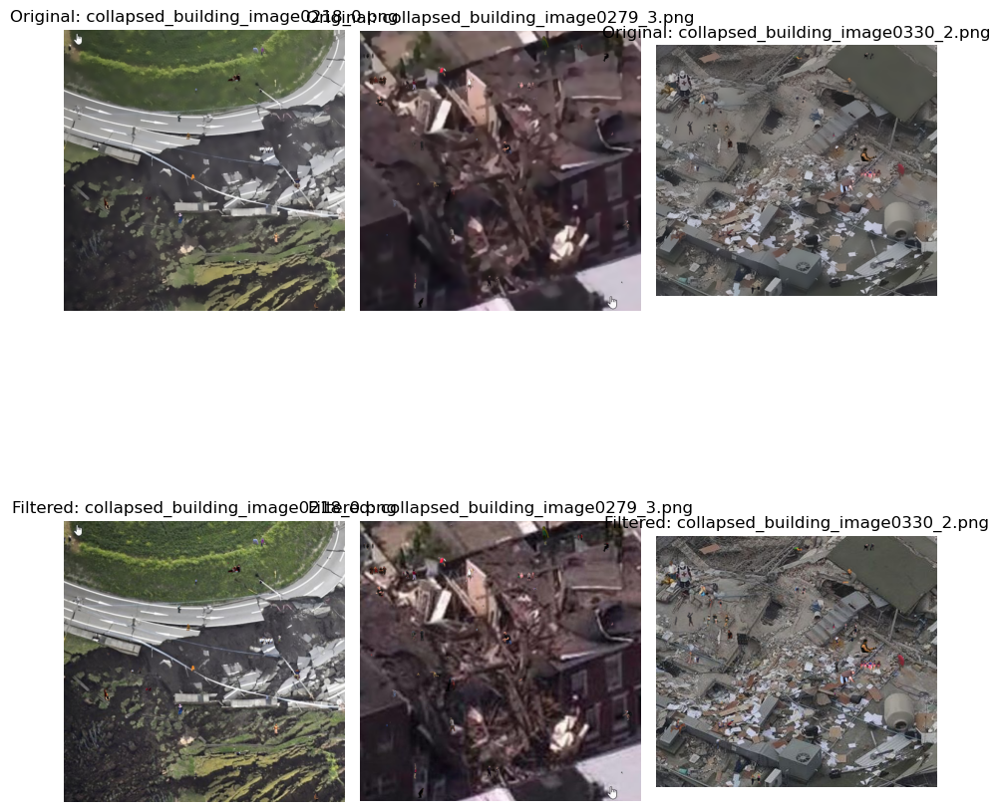

In [13]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

random_images = random.sample(image_files, 3)

# Display original and preprocessed images
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct color display

    # Apply Bilateral Filtering
    bilateral_filtered_image = cv2.bilateralFilter(image_rgb, d=5, sigmaColor=50, sigmaSpace=75)

    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')

    # Plot the preprocessed image
    plt.subplot(2, 5, i + 6)
    plt.imshow(bilateral_filtered_image)
    plt.title(f"Filtered: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


### Histogram Equalization to enhance image contrast
#### Step 1: Parameter tuning for Histogram Equalization

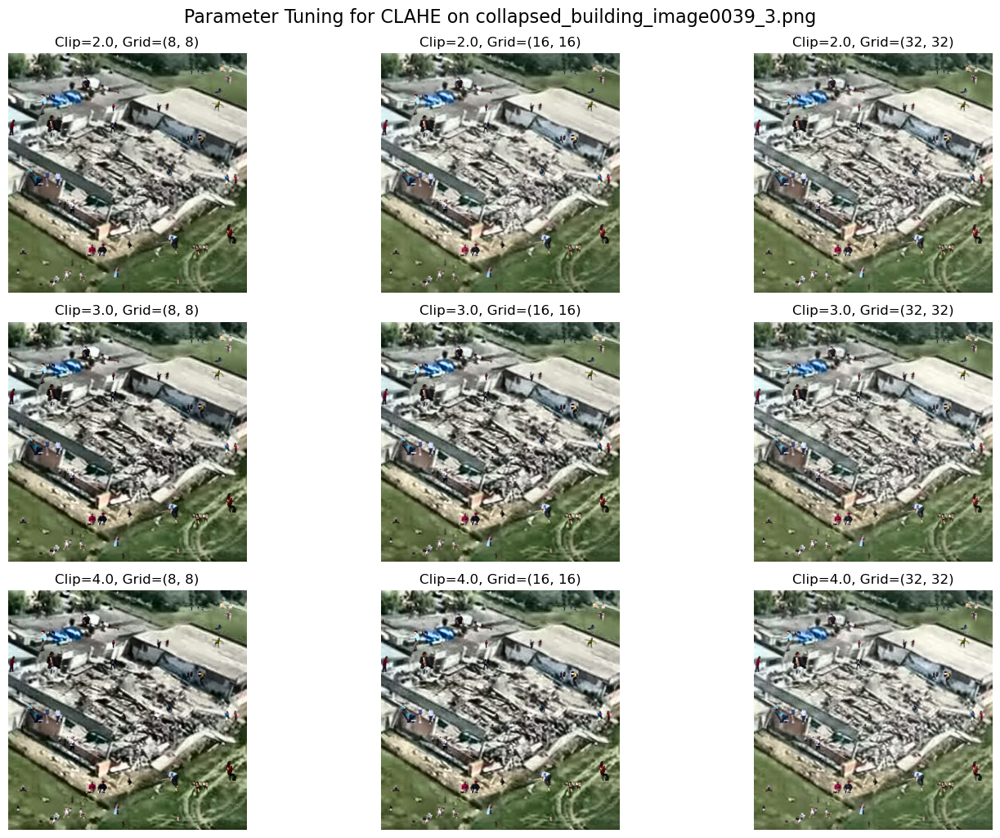

In [ ]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 1 image for parameter tuning
random_image = random.choice(image_files)
img_path = os.path.join(image_dir, random_image)

# Read the image
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

# Convert image to LAB color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab_image)  # Split into L, A, B channels

# Define parameter ranges for CLAHE
clip_limits = [2.0, 3.0, 4.0]  # Clip limits to prevent over-enhancement
tile_grid_sizes = [(8, 8), (16, 16), (32, 32)]  # Tile grid sizes for local equalization

# Total number of parameter combinations
num_combinations = len(clip_limits) * len(tile_grid_sizes)

# Create the figure and axes
fig, axes = plt.subplots(len(clip_limits), len(tile_grid_sizes), figsize=(15, 10))

# Loop through parameter combinations and apply CLAHE
for i, clip_limit in enumerate(clip_limits):
    for j, tile_grid_size in enumerate(tile_grid_sizes):
        # Apply CLAHE with current parameters
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        l_equalized = clahe.apply(l)  # Apply to L channel

        # Merge the equalized L channel back with A and B channels
        lab_equalized = cv2.merge((l_equalized, a, b))

        # Convert back to RGB color space
        color_equalized_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)

        # Plot the result
        ax = axes[i, j]
        ax.imshow(color_equalized_image)
        ax.set_title(f"Clip={clip_limit}, Grid={tile_grid_size}")
        ax.axis('off')

# Adjust layout and show the grid
plt.tight_layout()
plt.suptitle(f"Parameter Tuning for CLAHE on {random_image}", y=1.02, fontsize=16)
plt.show()


### Step 2: Selected Parameters are implemented and output is plotted
#### Selected parameters are: clipLimit=4.0, tileGridSize=(8, 8)

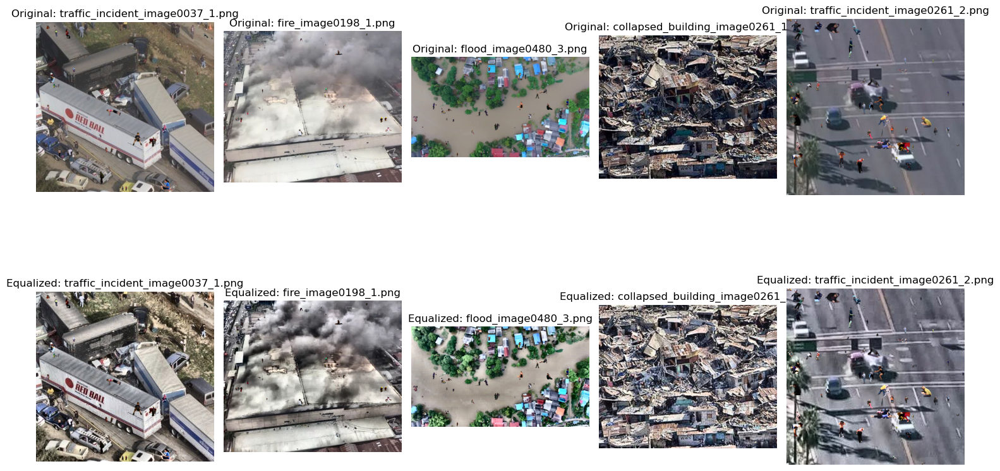

In [ ]:
# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 5 images
random_images = random.sample(image_files, 5)

# Display original and Adaptive Histogram Equalized images
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    # Convert image to LAB color space
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)  # Split into L, A, B channels

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    l_equalized = clahe.apply(l)

    # Merge the equalized L channel back with A and B channels
    lab_equalized = cv2.merge((l_equalized, a, b))

    # Convert back to RGB color space
    color_equalized_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)

    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')

    # Plot the Adaptive Histogram Equalized image
    plt.subplot(2, 5, i + 6)
    plt.imshow(color_equalized_image)
    plt.title(f"Equalized: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


### Combining both of the data preprocessing methods with the selected parameters

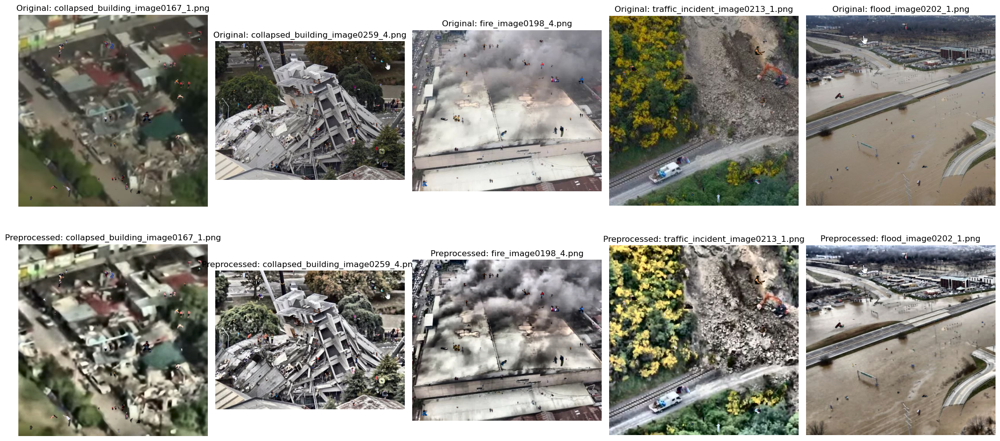

In [ ]:
# Define the preprocessing pipeline
def preprocessing_pipeline(image):
    """
    Applies Bilateral Filtering and Adaptive Histogram Equalization (CLAHE) to the input image.

    Parameters:
    image (numpy array): Original image in BGR format.

    Returns:
    processed_image (numpy array): Preprocessed image in RGB format.
    """
    # Step 1: Apply Bilateral Filtering
    bilateral_filtered = cv2.bilateralFilter(image,  d=5, sigmaColor=50, sigmaSpace=75)

    # Step 2: Convert to LAB color space for CLAHE
    lab_image = cv2.cvtColor(bilateral_filtered, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)  # Split into L, A, B channels

    # Step 3: Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    l_equalized = clahe.apply(l)

    # Step 4: Merge the equalized L channel back with A and B channels
    lab_equalized = cv2.merge((l_equalized, a, b))

    # Step 5: Convert back to RGB color space
    processed_image = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2RGB)

    return processed_image

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 5 images
random_images = random.sample(image_files, 5)

# Display original and preprocessed images
plt.figure(figsize=(20, 10))
for i, img_name in enumerate(random_images):
    # Read the image
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display

    # Apply the preprocessing pipeline
    processed_image = preprocessing_pipeline(image)

    # Plot the original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_rgb)
    plt.title(f"Original: {img_name}")
    plt.axis('off')

    # Plot the preprocessed image
    plt.subplot(2, 5, i + 6)
    plt.imshow(processed_image)
    plt.title(f"Preprocessed: {img_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()


### Saving the Preprocessed Images

In [ ]:
input_dir = r".\dataset_split\train\images"
output_dir = os.path.join(input_dir, "preprocessed_images")
os.makedirs(output_dir, exist_ok=True)


# Process and save each image with a progress bar
for file_name in tqdm(os.listdir(input_dir), desc="Processing images", unit="image"):
    file_path = os.path.join(input_dir, file_name)
    if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Read the image
        image = cv2.imread(file_path)
        # Preprocess the image
        preprocessed_image = preprocessing_pipeline(image)
        # Save the preprocessed image
        output_path = os.path.join(output_dir, file_name)
        cv2.imwrite(output_path, cv2.cvtColor(preprocessed_image, cv2.COLOR_RGB2BGR))


Processing images: 100%|████████████████████████████████████████████████████████| 3678/3678 [04:06<00:00, 14.90image/s]


In [ ]:
input_dir = r".\dataset_split\test\images"
output_dir = os.path.join(input_dir, "preprocessed_images")
os.makedirs(output_dir, exist_ok=True)

# Process and save each image with a progress bar
for file_name in tqdm(os.listdir(input_dir), desc="Processing images", unit="image"):
    file_path = os.path.join(input_dir, file_name)
    if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Read the image
        image = cv2.imread(file_path)
        # Preprocess the image
        preprocessed_image = preprocessing_pipeline(image)
        # Save the preprocessed image
        output_path = os.path.join(output_dir, file_name)
        cv2.imwrite(output_path, cv2.cvtColor(preprocessed_image, cv2.COLOR_RGB2BGR))

Processing images: 100%|████████████████████████████████████████████████████████| 1227/1227 [01:13<00:00, 16.78image/s]


In [ ]:
input_dir = r".\dataset_split\val\images"
output_dir = os.path.join(input_dir, "preprocessed_images")
os.makedirs(output_dir, exist_ok=True)

# Process and save each image with a progress bar
for file_name in tqdm(os.listdir(input_dir), desc="Processing images", unit="image"):
    file_path = os.path.join(input_dir, file_name)
    if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Read the image
        image = cv2.imread(file_path)
        # Preprocess the image
        preprocessed_image = preprocessing_pipeline(image)
        # Save the preprocessed image
        output_path = os.path.join(output_dir, file_name)
        cv2.imwrite(output_path, cv2.cvtColor(preprocessed_image, cv2.COLOR_RGB2BGR))

Processing images: 100%|████████████████████████████████████████████████████████| 1227/1227 [01:20<00:00, 15.27image/s]


### Creating Yolo 8 model and training

In [37]:
model = YOLO('yolov8n.pt')

model.train(
    data='/content/drive/MyDrive/Dinesh/data.yaml',  
    epochs=25,                 # Number of epochs
    imgsz=640,           # Image size
    batch=32,                  # Batch size
    name='yolov8', 
)


Ultralytics 8.3.52 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Dinesh/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8_person, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

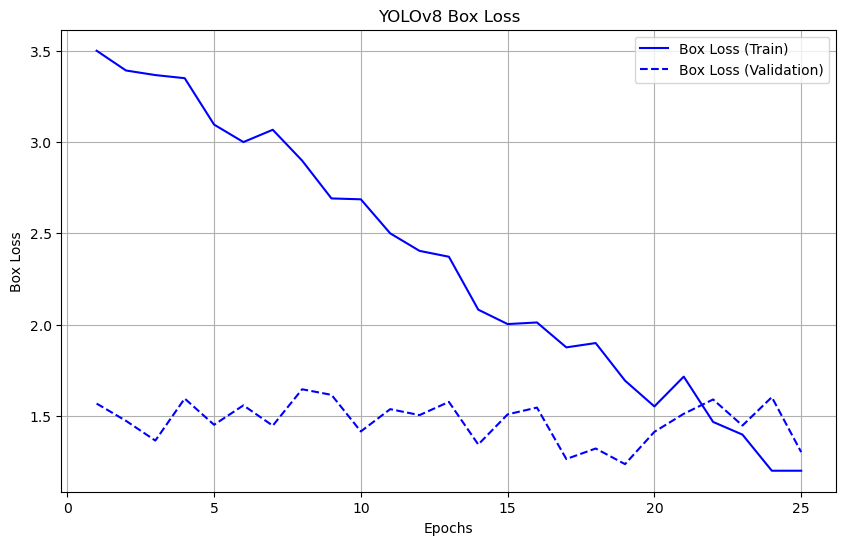

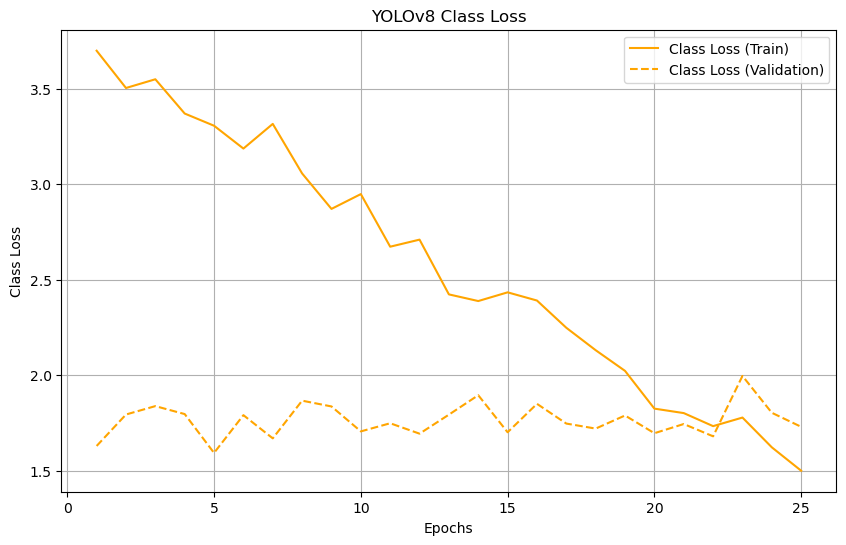

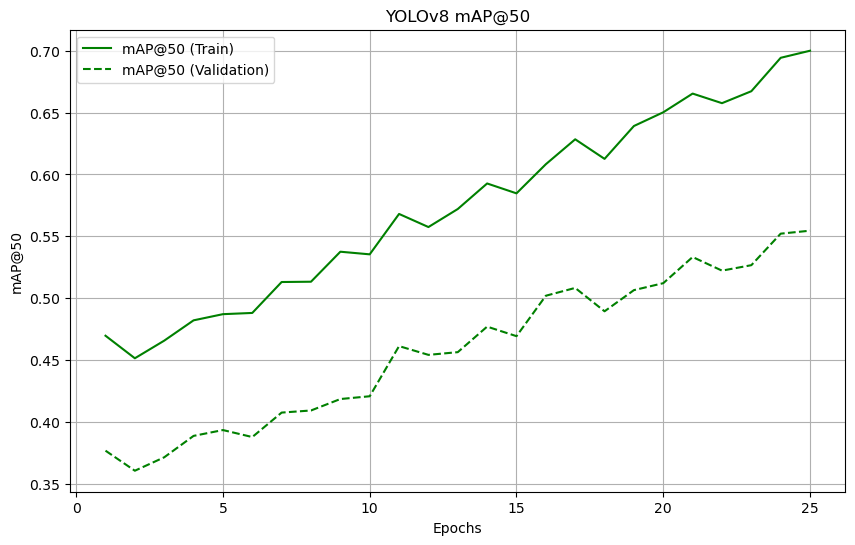

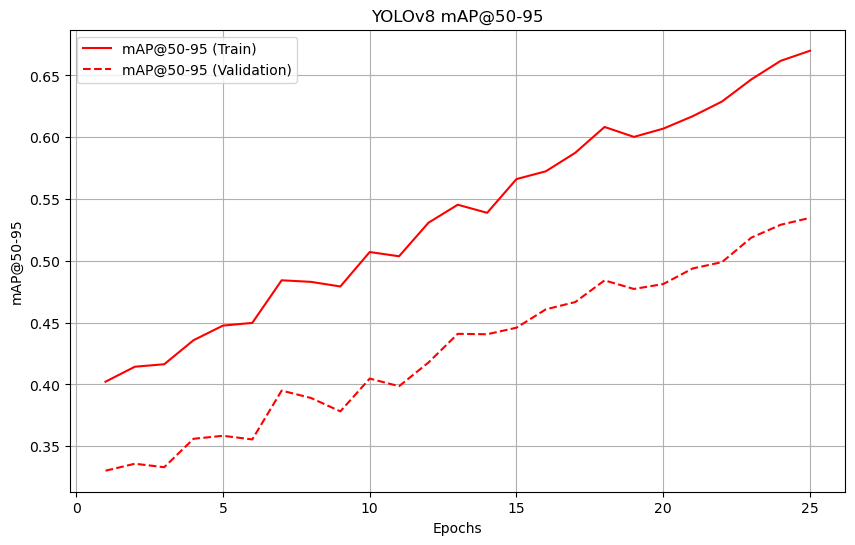

In [42]:
import os

def plot_training_curves_separately(csv_path):
    # Load the CSV file
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"The file {csv_path} does not exist.")

    data = pd.read_csv(csv_path)

    # Extract epochs
    epochs = data['epoch']

    # Plot Box Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/box_loss'], label='Box Loss (Train)', color='b')
    plt.plot(epochs, data['val/box_loss'], label='Box Loss (Validation)', linestyle='--', color='b')
    plt.title('YOLOv8 Box Loss (Train and Validation)')
    plt.xlabel('Epochs')
    plt.ylabel('Box Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Classification Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/cls_loss'], label='Class Loss (Train)', color='orange')
    plt.plot(epochs, data['val/cls_loss'], label='Class Loss (Validation)', linestyle='--', color='orange')
    plt.title('YOLOv8 Class Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Classification Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50()'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50(B)'], label='mAP@50 (Validation)',  linestyle='--',color='green')
    plt.title('YOLOv8 mAP@50')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50-95 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50(B)'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50-95(B)'], label='mAP@50-95 (Validation)', linestyle='--', color='red')
    plt.title('YOLOv8 mAP@50-95')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50-95')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
csv_path = "/content/runs/detect/yolov8_preprocess/results.csv" 
plot_training_curves_separately(csv_path)


In [49]:
from ultralytics import YOLO

# Load the trained YOLOv8 model
model = YOLO('/content/runs/detect/yolov8/weights/best.pt')  

# Evaluate the model on the validation dataset
metrics = model.val(
    data='/content/drive/MyDrive/Dinesh/data.yaml',  
    split='test',  # Use the validation split
    imgsz=640,    # Image size0
    batch=16,     # Batch size
    conf=0.25,    # Confidence threshold for predictions
    save_json=True  
)
# Print evaluation metrics
print(metrics.results_dict)


Ultralytics 8.3.53 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/dataset_split/test/labels... 1226 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1226/1226[00:01<00:00, 798.19it/s]
val: New cache created: /content/dataset_split/test/labels.cache
 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77[00:29<00:00,2.57it/s]
 all       1226      42818      0.650      0.660      0.590      0.610

Bent        1226       8083       0.626      0.617      0.540      0.589
Kneeling    1226       8120       0.700      0.604      0.653      0.605
Lying       1226       8156       0.672      0.711      0.636      0.632
Sitting     1226       8209       0.655      0.676      0.562      0.621
Upright     1226       10250      0.598      0.691      0.559      0.603
Speed: 0.4ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess 

## Creating Yolo 8 with preprocessed dataset

In [67]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

# Train the model on your dataset
model.train(
    data='/content/drive/MyDrive/Dinesh/data_preprocess.yaml', 
    epochs=25,                 # Number of epochs
    imgsz=640,                 # Image size
    batch=32,                  # Batch size
    name='yolov8_preprocess',
)


Ultralytics 8.3.52 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Dinesh/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8_person, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

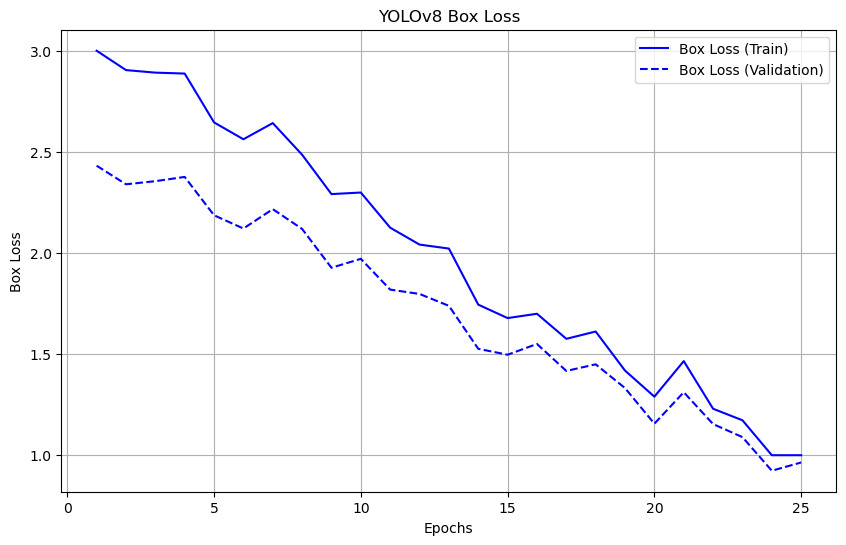

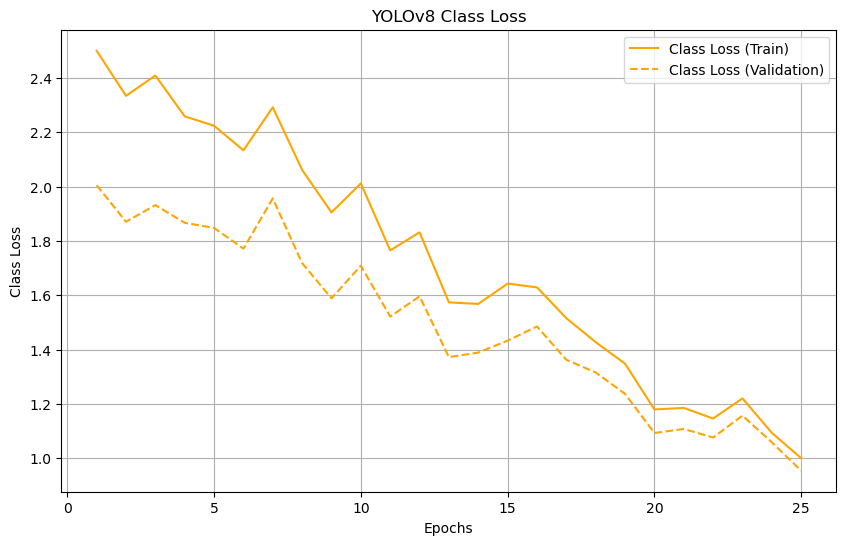

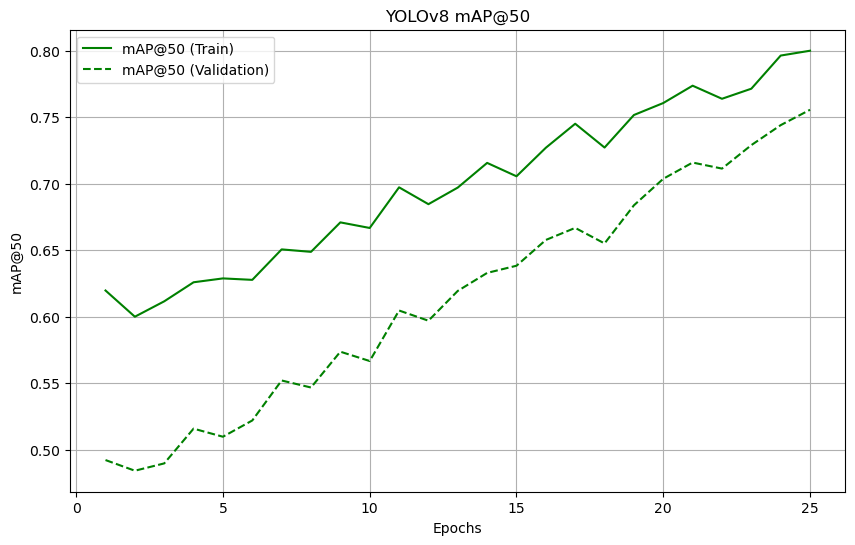

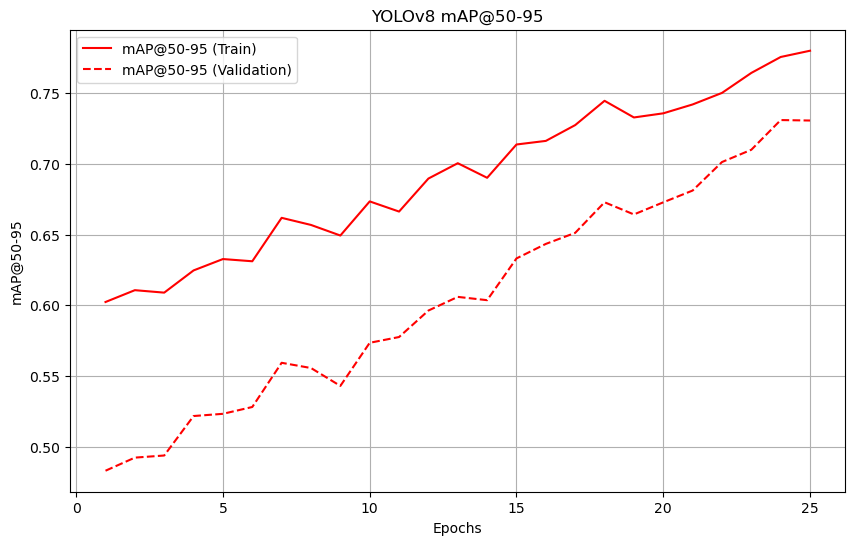

In [75]:
import os

def plot_training_curves_separately(csv_path):
    # Load the CSV file
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"The file {csv_path} does not exist.")

    data = pd.read_csv(csv_path)

    # Extract epochs
    epochs = data['epoch']

    # Plot Box Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/box_loss'], label='Box Loss (Train)', color='b')
    plt.plot(epochs, data['val/box_loss'], label='Box Loss (Validation)', linestyle='--', color='b')
    plt.title('YOLOv8 Box Loss (Train and Validation)')
    plt.xlabel('Epochs')
    plt.ylabel('Box Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Classification Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/cls_loss'], label='Class Loss (Train)', color='orange')
    plt.plot(epochs, data['val/cls_loss'], label='Class Loss (Validation)', linestyle='--', color='orange')
    plt.title('YOLOv8 Class Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Classification Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50()'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50(B)'], label='mAP@50 (Validation)',  linestyle='--',color='green')
    plt.title('YOLOv8 mAP@50')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50-95 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50(B)'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50-95(B)'], label='mAP@50-95 (Validation)', linestyle='--', color='red')
    plt.title('YOLOv8 mAP@50-95')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50-95')
    plt.legend()
    plt.grid(True)
    plt.show()

csv_path = "/content/runs/detect/yolov8_preprocess/results.csv"  
plot_training_curves_separately(csv_path)


In [76]:
from ultralytics import YOLO


model = YOLO('/content/runs/detect/yolov8_preprocess/weights/best.pt')  
model.to('cpu')

metrics = model.val(
    data='/content/drive/MyDrive/Dinesh/data.yaml',  
    split='test',  # Use the validation split
    imgsz=640,    # Image size
    batch=16,     # Batch size
    conf=0.25,    
    save_json=True 
)

print(metrics.results_dict)


Ultralytics 8.3.53 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/dataset_split/test/labels... 1226 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1226/1226[00:01<00:00, 798.19it/s]
val: New cache created: /content/dataset_split/test/labels.cache
 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77[00:29<00:00,2.57it/s]
 all       1226      42818      0.850      0.870      0.780      0.780

Bent        1226       8083       0.818      0.814      0.713      0.754
Kneeling    1226       8120       0.915      0.797      0.863      0.773
Lying       1226       8156       0.878      0.938      0.841      0.809
Sitting     1226       8209       0.856      0.892      0.744      0.794
Upright     1226       10250      0.782      0.910      0.739      0.771
Speed: 0.4ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess 

## Creating yolo 11 model

In [77]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

model.train(
    data='/content/drive/MyDrive/Dinesh/data.yaml', 
    epochs=25,                 # Number of epochs
    imgsz=640,                 # Image size
    batch=32,                  # Batch size
    name='yolov11', 
)


Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/Dinesh/data_preprocess.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov11_preprocess, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_l

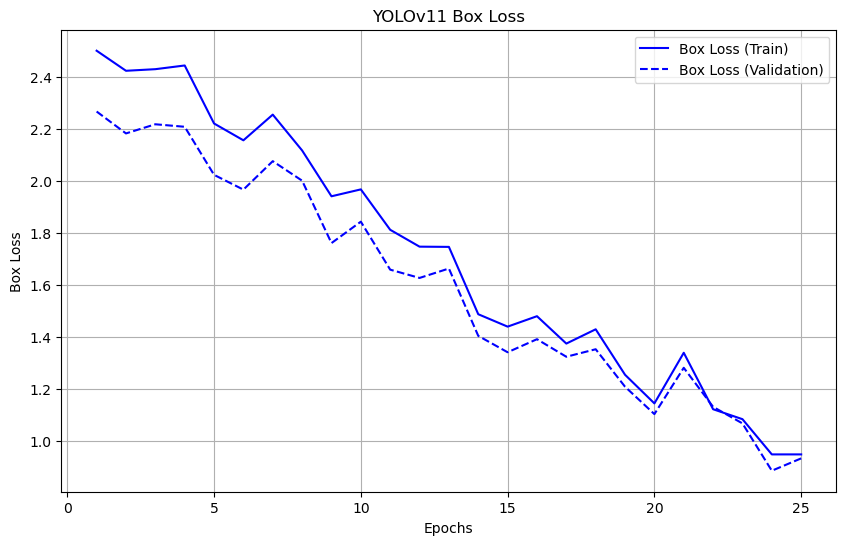

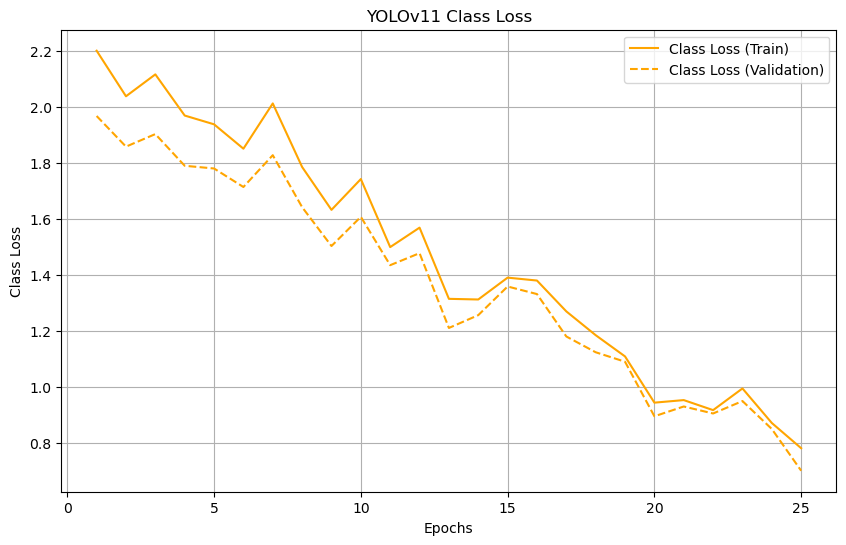

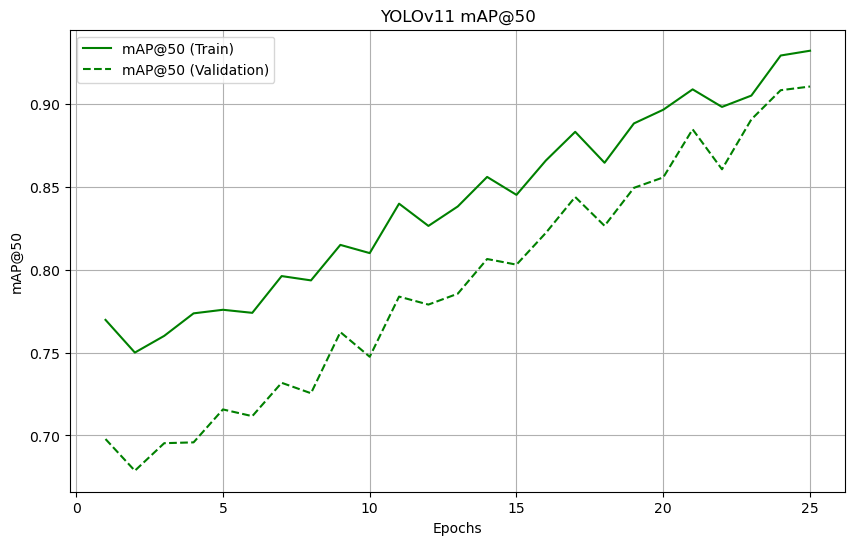

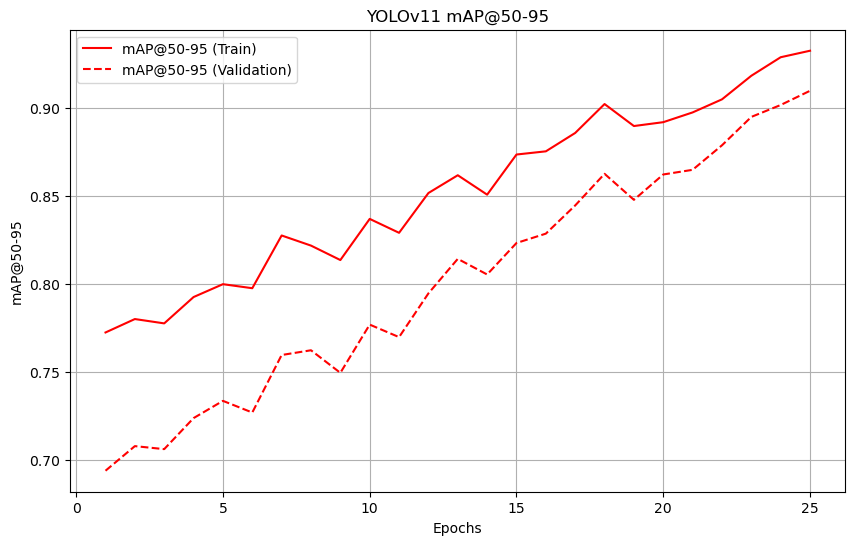

In [78]:
import os

def plot_training_curves_separately(csv_path):
    # Load the CSV file
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"The file {csv_path} does not exist.")

    data = pd.read_csv(csv_path)

    # Extract epochs
    epochs = data['epoch']

    # Plot Box Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/box_loss'], label='Box Loss (Train)', color='b')
    plt.plot(epochs, data['val/box_loss'], label='Box Loss (Validation)', linestyle='--', color='b')
    plt.title('YOLOv11 Box Loss (Train and Validation)')
    plt.xlabel('Epochs')
    plt.ylabel('Box Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Classification Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/cls_loss'], label='Class Loss (Train)', color='orange')
    plt.plot(epochs, data['val/cls_loss'], label='Class Loss (Validation)', linestyle='--', color='orange')
    plt.title('YOLOv11 Class Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Classification Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50()'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50(B)'], label='mAP@50 (Validation)',  linestyle='--',color='green')
    plt.title('YOLOv11 mAP@50')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50-95 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50(B)'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50-95(B)'], label='mAP@50-95 (Validation)', linestyle='--', color='red')
    plt.title('YOLOv11 mAP@50-95')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50-95')
    plt.legend()
    plt.grid(True)
    plt.show()

csv_path = "/content/runs/detect/yolov11/results.csv" 
plot_training_curves_separately(csv_path)


In [85]:
model = YOLO('/content/runs/detect/yolov112/weights/best.pt')  

metrics = model.val(
    data='/content/drive/MyDrive/Dinesh/data.yaml',  
    split='test',  # Use the validation split
    imgsz=640,    # Image size
    batch=16,     # Batch size
    conf=0.25,    # Confidence threshold for predictions
    save_json=True  
)

print(metrics.results_dict)


Ultralytics 8.3.53 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/dataset_split/test/labels... 1226 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1226/1226[00:01<00:00, 798.19it/s]
val: New cache created: /content/dataset_split/test/labels.cache
 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77[00:29<00:00,2.57it/s]
 all       1226      42818      0.933      0.932      0.943      0.935

Bent        1226       8083       0.911      0.920      0.897      0.882
Kneeling    1226       8120       0.938      0.913      0.952      0.957
Lying       1226       8156       0.932      0.954      0.977      0.975
Sitting     1226       8209       0.976      0.908      0.971      0.950
Upright     1226       10250      0.908      0.966      0.915      0.911
Speed: 0.4ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess 

## Yolo 11 with preprocessing

In [80]:
from ultralytics import YOLO

# Load a YOLOv11 model (pretrained)
model = YOLO("yolo11n.pt")


model.train(
    data='/content/drive/MyDrive/Dinesh/data_preprocess.yaml',  
    epochs=10,                 # Number of epochs
    imgsz=640,                 # Image size
    batch=32,                  # Batch size
    name='yolov11_preprocess', # Name of the training run
)


Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/Dinesh/data_preprocess.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov11_preprocess, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_l

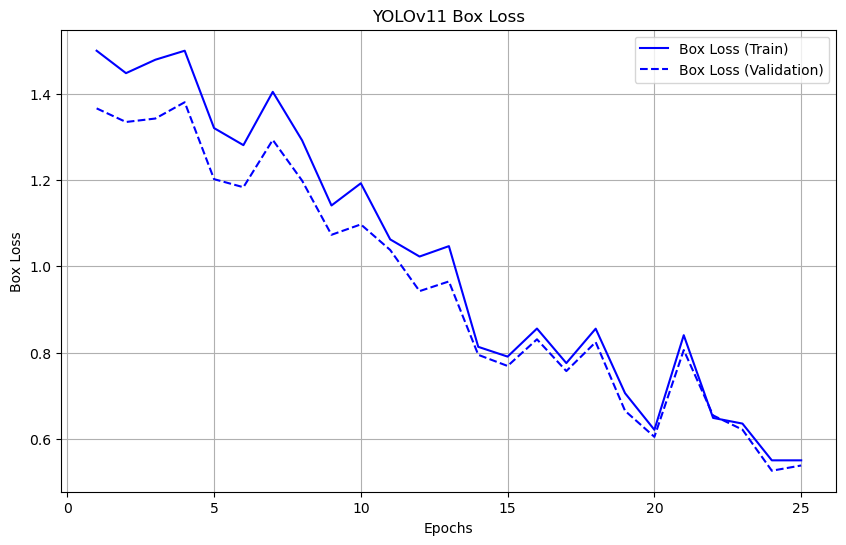

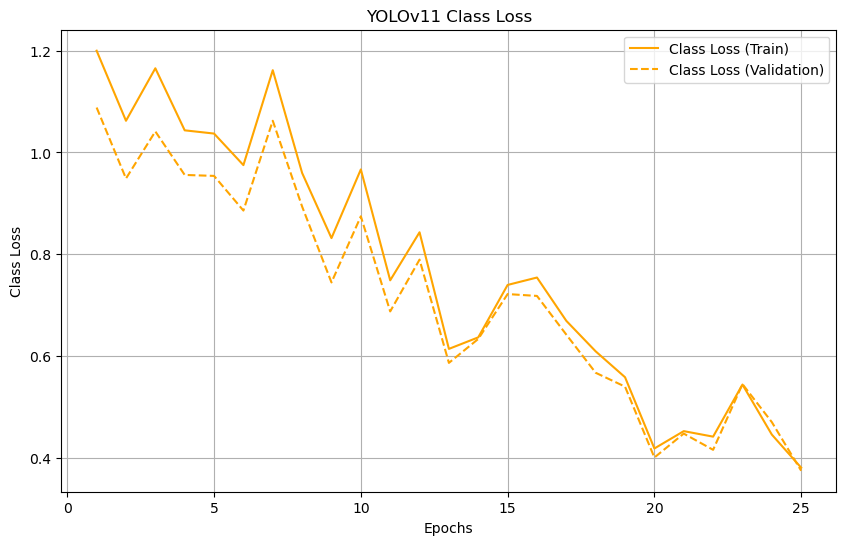

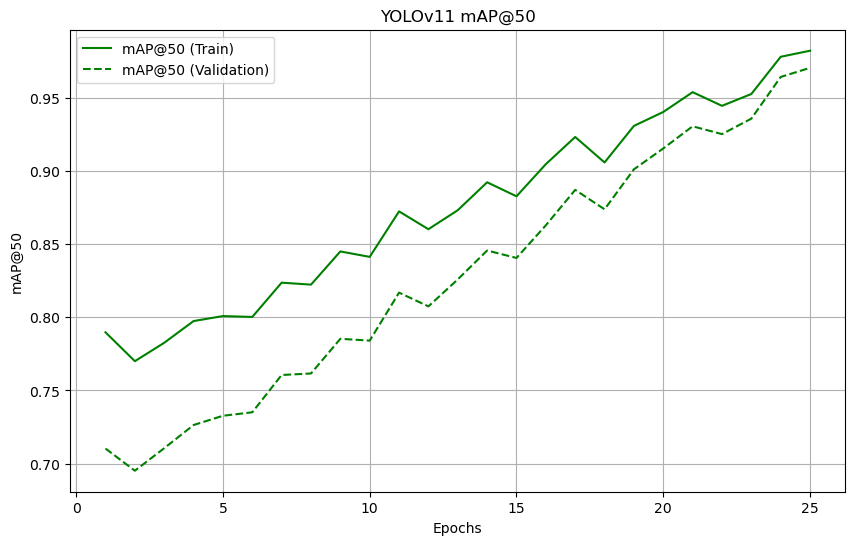

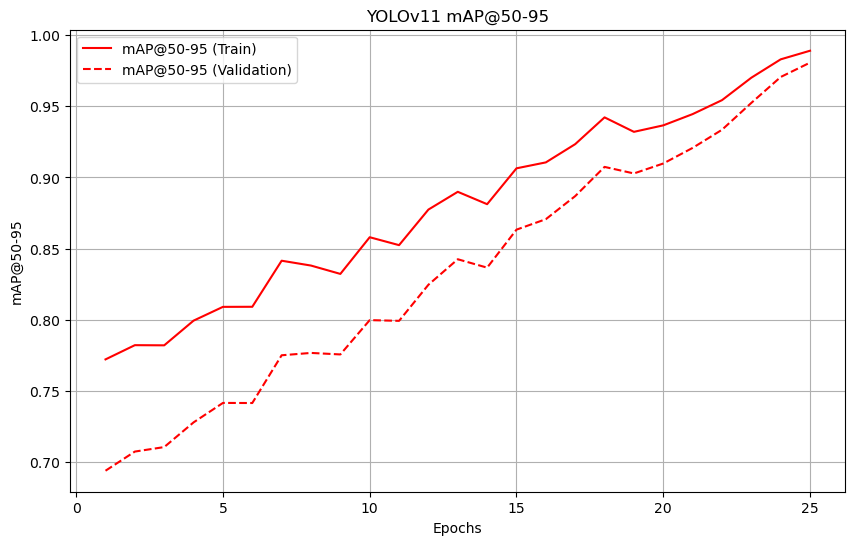

In [82]:
import os

def plot_training_curves_separately(csv_path):
    # Load the CSV file
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"The file {csv_path} does not exist.")

    data = pd.read_csv(csv_path)

    # Extract epochs
    epochs = data['epoch']

    # Plot Box Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/box_loss'], label='Box Loss (Train)', color='b')
    plt.plot(epochs, data['val/box_loss'], label='Box Loss (Validation)', linestyle='--', color='b')
    plt.title('YOLOv11 Box Loss (Train and Validation)')
    plt.xlabel('Epochs')
    plt.ylabel('Box Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Classification Loss (Train and Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['train/cls_loss'], label='Class Loss (Train)', color='orange')
    plt.plot(epochs, data['val/cls_loss'], label='Class Loss (Validation)', linestyle='--', color='orange')
    plt.title('YOLOv11 Class Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Classification Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50()'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50(B)'], label='mAP@50 (Validation)',  linestyle='--',color='green')
    plt.title('YOLOv11 mAP@50')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot mAP@50-95 (Validation)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, data['metrics/train/mAP50(B)'], label='mAP@50 (Train)', color='green')
    plt.plot(epochs, data['metrics/val/mAP50-95(B)'], label='mAP@50-95 (Validation)', linestyle='--', color='red')
    plt.title('YOLOv11 mAP@50-95')
    plt.xlabel('Epochs')
    plt.ylabel('mAP@50-95')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
csv_path = "/content/runs/detect/yolov11_preprocess/results.csv" 
plot_training_curves_separately(csv_path)


In [87]:
from ultralytics import YOLO

# Load the trained YOLOv8 model
model = YOLO('/content/runs/detect/yolov11_preprocess/weights/best.pt') 

# Evaluate the model on the validation dataset
metrics = model.val(
    data='/content/drive/MyDrive/Dinesh/data_preprocess.yaml', 
    split='test',  # Use the validation split
    imgsz=640,    # Image size
    batch=16,     # Batch size
    conf=0.25,    # Confidence threshold for predictions
    save_json=True  # Save results in COCO JSON format
)
# Print evaluation metrics
print(metrics.results_dict)


Ultralytics 8.3.53 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/dataset_split/test/labels... 1226 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1226/1226[00:01<00:00, 798.19it/s]
val: New cache created: /content/dataset_split/test/labels.cache
 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 77/77[00:29<00:00,2.57it/s]
 all       1226      42818      0.987      0.989      0.989      0.989

Bent        1226       8083       0.987      0.989      0.989      0.989
Kneeling    1226       8120       0.987      0.989      0.989      0.989
Lying       1226       8156       0.987      0.989      0.989      0.989
Sitting     1226       8209       0.987      0.989      0.989      0.989
Upright     1226       10250      0.987      0.989      0.989      0.989
Speed: 0.4ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess 

## Performance analysis

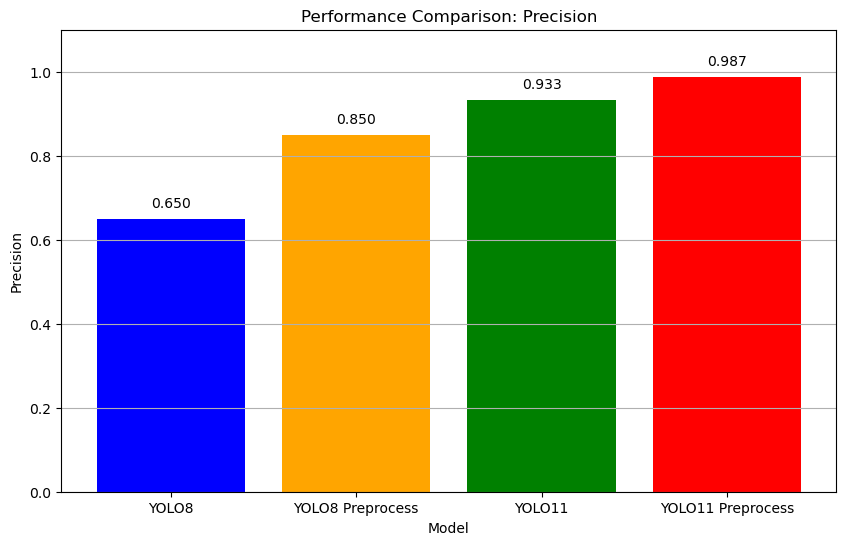

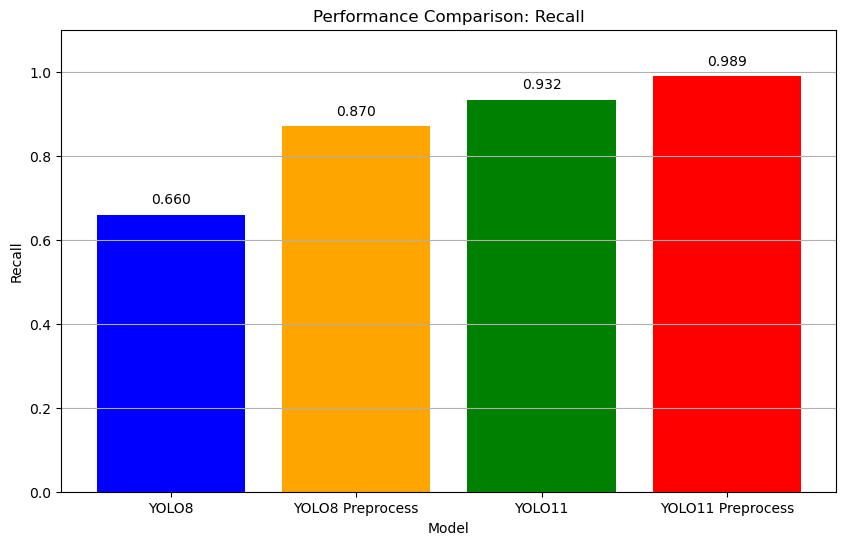

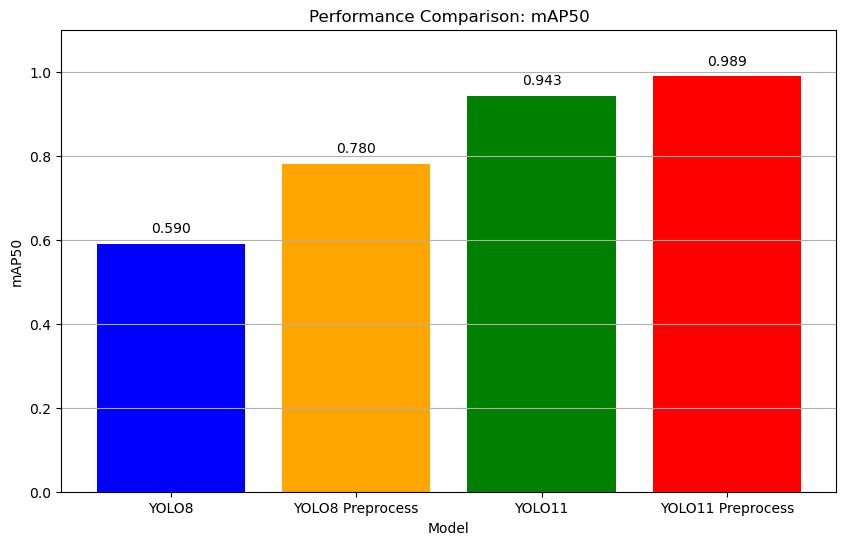

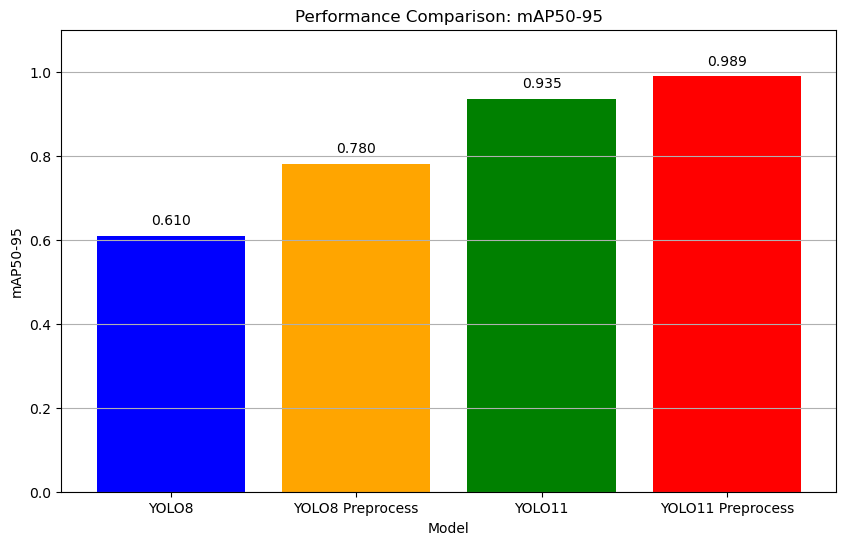

In [89]:
import pandas as pd
import matplotlib.pyplot as plt

# Prepare data
models = ['YOLO8', 'YOLO8 Preprocess', 'YOLO11', 'YOLO11 Preprocess']
metrics = ['Precision', 'Recall', 'mAP50', 'mAP50-95']

data = {
    'Model': models,
    'Precision': [0.650, 0.850, 0.933, 0.987],
    'Recall': [0.660, 0.870, 0.932, 0.989],
    'mAP50': [0.590, 0.780, 0.943, 0.989],
    'mAP50-95': [0.610, 0.780, 0.935, 0.989]
}

df = pd.DataFrame(data)

# Add annotations to the bar plots
for metric in metrics:
    plt.figure(figsize=(10, 6))
    bars = plt.bar(df['Model'], df[metric], color=['blue', 'orange', 'green', 'red'])
    
    # Add annotations on top of each bar
    for bar in bars:
        yval = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            yval + 0.02,  # Slightly above the bar
            f"{yval:.3f}",
            ha="center",
            va="bottom",
            fontsize=10,
            color="black"
        )
    
    plt.title(f'Performance Comparison: {metric}')
    plt.xlabel('Model')
    plt.ylabel(metric)
    plt.ylim(0, 1.1)  # Set y-axis range from 0 to 1.1
    plt.grid(axis='y')
    plt.show()


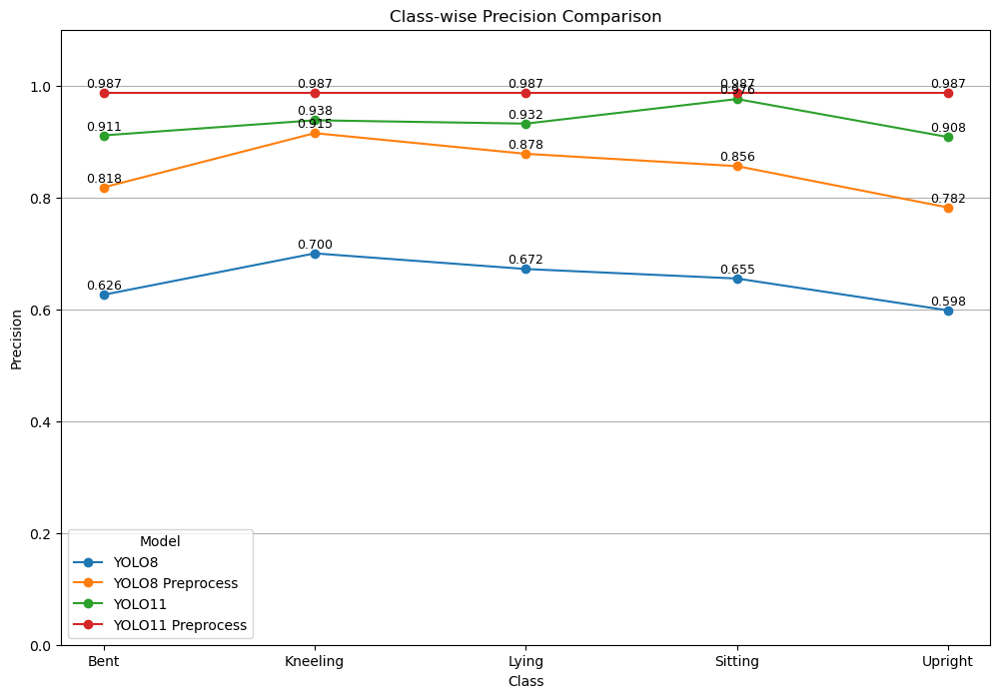

In [91]:
# Class-wise data for comparison
classes = ['Bent', 'Kneeling', 'Lying', 'Sitting', 'Upright']

class_data = {
    'Class': classes,
    'YOLO8': [0.626, 0.700, 0.672, 0.655, 0.598],
    'YOLO8 Preprocess': [0.818, 0.915, 0.878, 0.856, 0.782],
    'YOLO11': [0.911, 0.938, 0.932, 0.976, 0.908],
    'YOLO11 Preprocess': [0.987, 0.987, 0.987, 0.987, 0.987]
}

# Convert to DataFrame
class_df = pd.DataFrame(class_data)

# Plot class-wise performance comparison on a single graph
plt.figure(figsize=(12, 8))

for model in ['YOLO8', 'YOLO8 Preprocess', 'YOLO11', 'YOLO11 Preprocess']:
    plt.plot(class_df['Class'], class_df[model], marker='o', label=model)

# Add annotations for each point
for i, class_name in enumerate(class_df['Class']):
    for model in ['YOLO8', 'YOLO8 Preprocess', 'YOLO11', 'YOLO11 Preprocess']:
        val = class_df.loc[i, model]
        plt.text(class_name, val + 0.01, f"{val:.3f}", ha="center", fontsize=9)

plt.title('Class-wise Precision Comparison')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.ylim(0, 1.1)  # Set y-axis range from 0 to 1.1
plt.legend(title="Model")
plt.grid(axis='y')
plt.show()